In [1]:
#Import Required Packages for EDA 
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno 
import plotly.graph_objects as go 
import plotly.express as px 
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import numpy as np 
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')



In [2]:
#Read the dataset/s

df = pd.read_csv(r'D:\Users\DELL\Documents\UC\Sem 3\ST\STCapstone\Spotify_Youtube.csv')

#Cleaning the data by dropping the unwanted variables and missing values
df.drop(['Unnamed: 0','Channel','Url_spotify',"Uri","Url_youtube","Title","Views","Likes","Comments","Description","Licensed","official_video"], axis =1, inplace = True)
df.dropna()


,Artist,Track,Album,Album_type,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Stream
0,Gorillaz,Feel Good Inc.,Demon Days,album,0.818,0.705,6.0,-6.679,0.1770,0.008360,0.002330,0.6130,0.7720,138.559,222640.0,1.040235e+09
1,Gorillaz,Rhinestone Eyes,Plastic Beach,album,0.676,0.703,8.0,-5.815,0.0302,0.086900,0.000687,0.0463,0.8520,92.761,200173.0,3.100837e+08
2,Gorillaz,New Gold (feat. Tame Impala and Bootie Brown),New Gold (feat. Tame Impala and Bootie Brown),single,0.695,0.923,1.0,-3.930,0.0522,0.042500,0.046900,0.1160,0.5510,108.014,215150.0,6.306347e+07
3,Gorillaz,On Melancholy Hill,Plastic Beach,album,0.689,0.739,2.0,-5.810,0.0260,0.000015,0.509000,0.0640,0.5780,120.423,233867.0,4.346636e+08
4,Gorillaz,Clint Eastwood,Gorillaz,album,0.663,0.694,10.0,-8.627,0.1710,0.025300,0.000000,0.0698,0.5250,167.953,340920.0,6.172597e+08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20713,SICK LEGEND,JUST DANCE HARDSTYLE,JUST DANCE HARDSTYLE,single,0.582,0.926,5.0,-6.344,0.0328,0.448000,0.000000,0.0839,0.6580,90.002,94667.0,9.227144e+06
20714,SICK LEGEND,SET FIRE TO THE RAIN HARDSTYLE,SET FIRE TO THE RAIN HARDSTYLE,single,0.531,0.936,4.0,-1.786,0.1370,0.028000,0.000000,0.0923,0.6570,174.869,150857.0,1.089818e+07
20715,SICK LEGEND,OUTSIDE HARDSTYLE SPED UP,OUTSIDE HARDSTYLE SPED UP,single,0.443,0.830,4.0,-4.679,0.0647,0.024300,0.000000,0.1540,0.4190,168.388,136842.0,6.226110e+06
20716,SICK LEGEND,ONLY GIRL HARDSTYLE,ONLY GIRL HARDSTYLE,single,0.417,0.767,9.0,-4.004,0.4190,0.356000,0.018400,0.1080,0.5390,155.378,108387.0,6.873961e+06


In [4]:
#(1)	The EDA starts with  understanding the basic description of data as described next:
#1. Checking description(first 5 and last 5 rows)
df.head() 


,Artist,Track,Album,Album_type,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Stream
0,Gorillaz,Feel Good Inc.,Demon Days,album,0.818,0.705,6.0,-6.679,0.1770,0.008360,0.002330,0.6130,0.772,138.559,222640.0,1.040235e+09
1,Gorillaz,Rhinestone Eyes,Plastic Beach,album,0.676,0.703,8.0,-5.815,0.0302,0.086900,0.000687,0.0463,0.852,92.761,200173.0,3.100837e+08
2,Gorillaz,New Gold (feat. Tame Impala and Bootie Brown),New Gold (feat. Tame Impala and Bootie Brown),single,0.695,0.923,1.0,-3.930,0.0522,0.042500,0.046900,0.1160,0.551,108.014,215150.0,6.306347e+07
3,Gorillaz,On Melancholy Hill,Plastic Beach,album,0.689,0.739,2.0,-5.810,0.0260,0.000015,0.509000,0.0640,0.578,120.423,233867.0,4.346636e+08
4,Gorillaz,Clint Eastwood,Gorillaz,album,0.663,0.694,10.0,-8.627,0.1710,0.025300,0.000000,0.0698,0.525,167.953,340920.0,6.172597e+08


In [5]:
df.tail()

,Artist,Track,Album,Album_type,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Stream
20713,SICK LEGEND,JUST DANCE HARDSTYLE,JUST DANCE HARDSTYLE,single,0.582,0.926,5.0,-6.344,0.0328,0.44800,0.0000,0.0839,0.6580,90.002,94667.0,9227144.0
20714,SICK LEGEND,SET FIRE TO THE RAIN HARDSTYLE,SET FIRE TO THE RAIN HARDSTYLE,single,0.531,0.936,4.0,-1.786,0.1370,0.02800,0.0000,0.0923,0.6570,174.869,150857.0,10898176.0
20715,SICK LEGEND,OUTSIDE HARDSTYLE SPED UP,OUTSIDE HARDSTYLE SPED UP,single,0.443,0.830,4.0,-4.679,0.0647,0.02430,0.0000,0.1540,0.4190,168.388,136842.0,6226110.0
20716,SICK LEGEND,ONLY GIRL HARDSTYLE,ONLY GIRL HARDSTYLE,single,0.417,0.767,9.0,-4.004,0.4190,0.35600,0.0184,0.1080,0.5390,155.378,108387.0,6873961.0
20717,SICK LEGEND,MISS YOU HARDSTYLE,MISS YOU HARDSTYLE,single,0.498,0.938,6.0,-4.543,0.1070,0.00277,0.9110,0.1360,0.0787,160.067,181500.0,5695584.0


In [6]:
#rows and columns-data shape(attributes & samples)
df.shape

(20718, 16)

In [7]:
# name of the attributes
df.columns
 

Index(['Artist', 'Track', 'Album', 'Album_type', 'Danceability', 'Energy',
       'Key', 'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness',
       'Liveness', 'Valence', 'Tempo', 'Duration_ms', 'Stream'],
      dtype='object')

In [8]:
#unique values for each attribute
df.nunique()


Artist               2079
Track               17841
Album               11937
Album_type              3
Danceability          898
Energy               1268
Key                    12
Loudness             9417
Speechiness          1303
Acousticness         3138
Instrumentalness     4012
Liveness             1536
Valence              1293
Tempo               15024
Duration_ms         14690
Stream              18461
dtype: int64

In [9]:
#Complete info about data frame
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20718 entries, 0 to 20717
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Artist            20718 non-null  object 
 1   Track             20718 non-null  object 
 2   Album             20718 non-null  object 
 3   Album_type        20718 non-null  object 
 4   Danceability      20716 non-null  float64
 5   Energy            20716 non-null  float64
 6   Key               20716 non-null  float64
 7   Loudness          20716 non-null  float64
 8   Speechiness       20716 non-null  float64
 9   Acousticness      20716 non-null  float64
 10  Instrumentalness  20716 non-null  float64
 11  Liveness          20716 non-null  float64
 12  Valence           20716 non-null  float64
 13  Tempo             20716 non-null  float64
 14  Duration_ms       20716 non-null  float64
 15  Stream            20142 non-null  float64
dtypes: float64(12), object(4)
memory usage: 

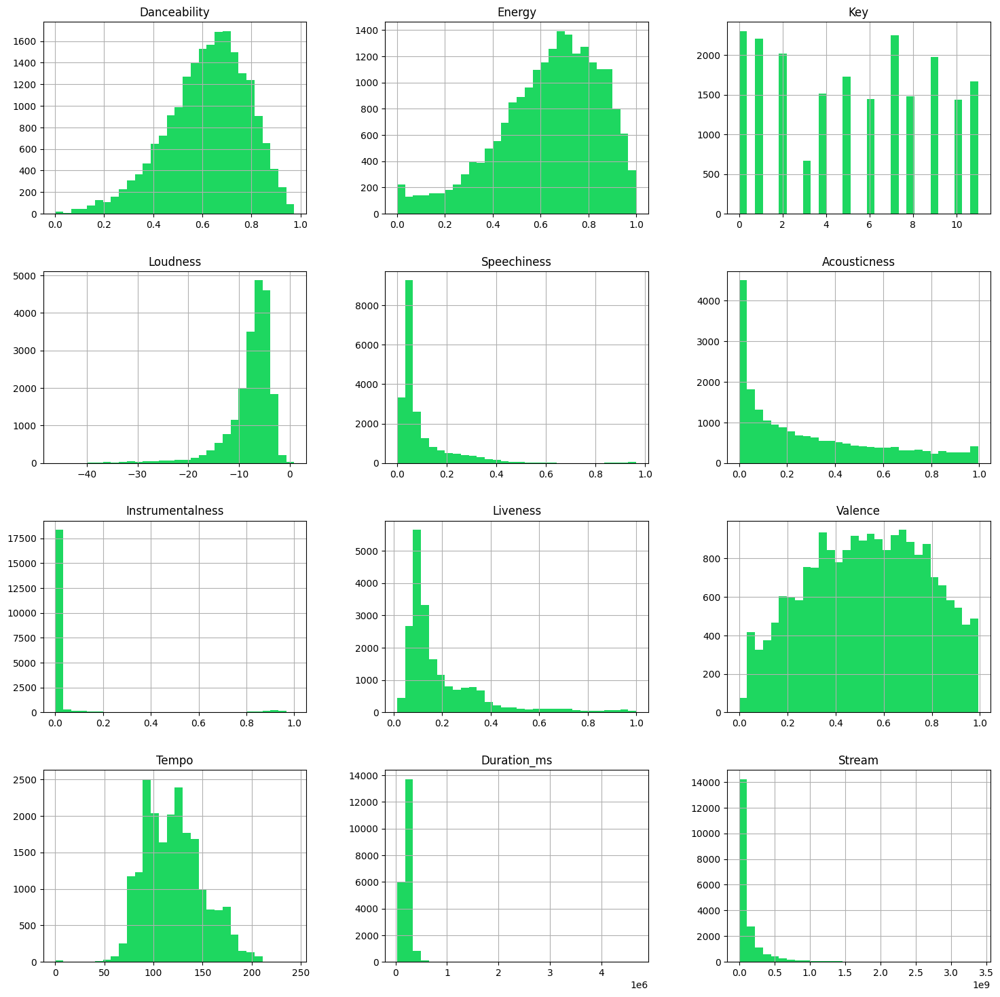

In [10]:
#3. Visualising data  distribution in detail
fig = plt.figure(figsize =(18,18))
ax=fig.gca()
df.hist(ax=ax,bins =30,color='#1ED760')
plt.show()


album          14926
single          5004
compilation      788
Name: Album_type, dtype: int64


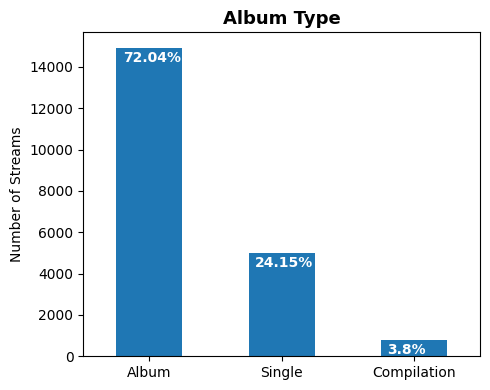

In [22]:

#checking target value distribution
print(df.Album_type.value_counts())
fig, ax = plt.subplots(figsize=(5,4))
name = ["Album", "Single", "Compilation"]
ax = df.Album_type.value_counts().plot(kind='bar')
ax.set_title("Album Type", fontsize = 13, weight = 'bold')
ax.set_xticklabels (name, rotation = 0)
plt.ylabel('Number of Streams')

# To calculate the percentage
totals = []
for i in ax.patches:
    totals.append(i.get_height())
total = sum(totals)
for i in ax.patches:
    ax.text(i.get_x()+.05, i.get_height()-700, \
            str(round((i.get_height()/total)*100, 2))+'%', fontsize=10,
                color='white', weight = 'bold')
    
plt.tight_layout()


In [23]:
album_type_count = df['Album_type'].value_counts()
print(album_type_count)

album          14926
single          5004
compilation      788
Name: Album_type, dtype: int64


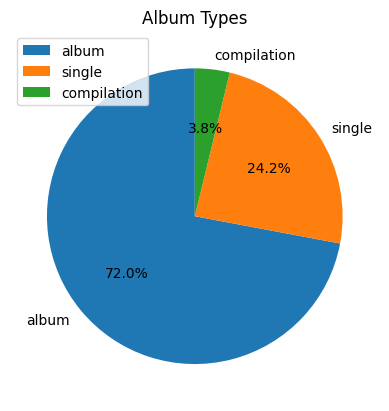

In [26]:
labels = album_type_count.index.tolist()
sizes = album_type_count.values.tolist()
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)

plt.title('Album Types')
plt.legend(labels, loc='best')

plt.show()

In [28]:
# Group the songs by artist - stream - spotify
artist_grouped = df.groupby('Artist')[['Stream']].sum()

# Sort the artists by the sum of streams in descending order
artist_sorted = artist_grouped.sort_values(['Stream'], ascending=False)

# Get the top 10 artists with the most number of streams on Spotify
top_10 = artist_sorted.head(10)

top_10

,Stream
Artist,
Post Malone,1.525126e+10
Ed Sheeran,1.439488e+10
Dua Lipa,1.340808e+10
XXXTENTACION,1.322435e+10
The Weeknd,1.303197e+10
Justin Bieber,1.209777e+10
Imagine Dragons,1.185831e+10
Coldplay,1.177848e+10
Khalid,1.138684e+10


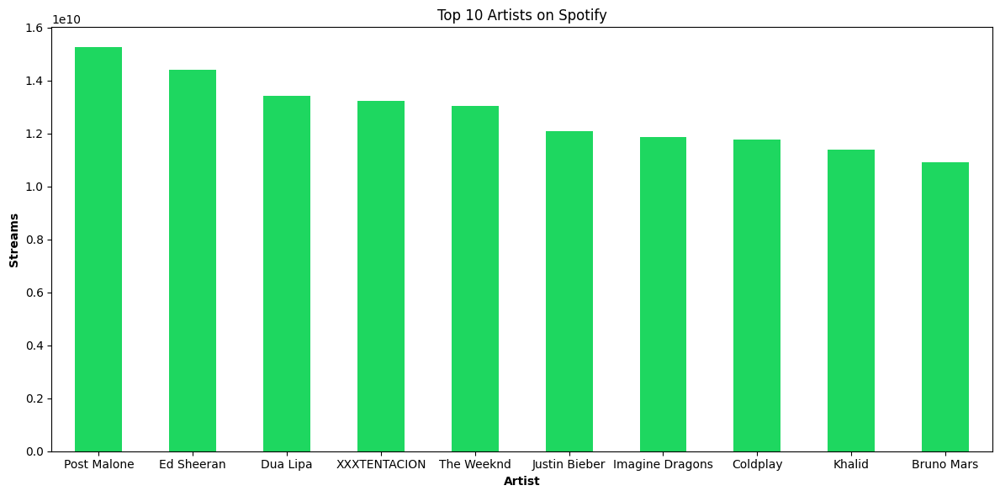

In [29]:
# Create two separate DataFrames for views and streams
df_streams = df.groupby('Artist')['Stream'].sum().sort_values(ascending=False)[:10]

fig, (ax1) = plt.subplots(1, figsize=(12,6))

# top 10 spotofy
ax1.set_title('Top 10 Artists on Spotify')
df_streams.plot(kind='bar', ax=ax1, color='#1ED760', rot=0)



ax1.set_xlabel('Artist', weight='bold')
ax1.set_ylabel('Streams', weight='bold')

fig.tight_layout()
plt.show()

In [30]:
top_songs = df.sort_values('Stream', ascending=False).head(10)
top_songs[['Track', 'Valence', 'Danceability', 'Acousticness']]

,Track,Valence,Danceability,Acousticness
15250,Blinding Lights,0.334,0.514,0.00146
12452,Shape of You,0.931,0.825,0.58100
19186,Someone You Loved,0.446,0.501,0.75100
17937,rockstar (feat. 21 Savage),0.129,0.585,0.12400
17445,Sunflower - Spider-Man: Into the Spider-Verse,0.925,0.755,0.53300
17938,Sunflower - Spider-Man: Into the Spider-Verse,0.925,0.755,0.53300
13503,One Dance,0.370,0.792,0.00776
16099,Closer,0.661,0.748,0.41400
16028,Closer,0.661,0.748,0.41400
14030,Believer,0.666,0.776,0.06220


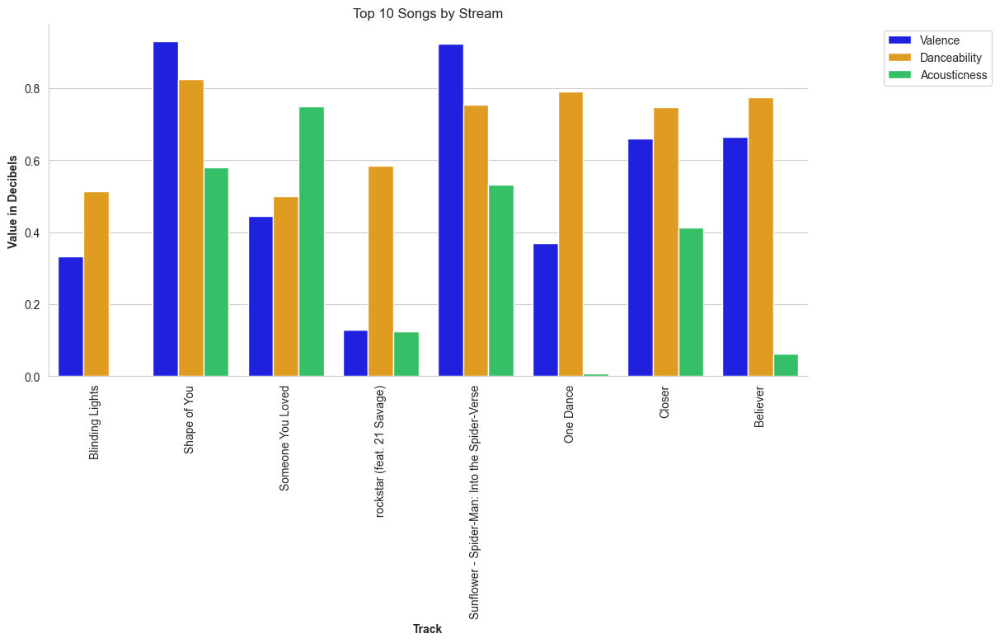

In [31]:
top_songs_melt = top_songs.melt(id_vars=['Track'], value_vars=['Valence', 'Danceability', 'Acousticness'],
                                var_name='Attribute', value_name='Value')

sns.set_style('whitegrid')
sns.catplot(x='Track', y='Value', hue='Attribute', data=top_songs_melt, kind='bar',
            palette={'Valence': 'blue', 'Danceability': 'orange', 'Acousticness': '#1ed760'},
            aspect=2, legend=False)


plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1))
plt.title('Top 10 Songs by Stream')
plt.xlabel('Track', weight='bold')
plt.ylabel('Value in Decibels', weight='bold')

plt.xticks(rotation=90)
plt.show()

In [32]:
!pip install ydata-profiling

In [38]:
#obtain full profiler report
#restart kernel

#re-run import libraries and data
from ydata_profiling import ProfileReport
profile = ProfileReport(df,title="Spotify Streams EDA",
                        html={'style':{'full_width':True}})
profile.to_notebook_iframe()

#Exporting the profiler report as an HTML

profile.to_file(output_file="Spotify EDA report.html")



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [39]:
#pre-processing
from sklearn.exceptions import DataDimensionalityWarning
#encode object columns to integers
from sklearn import preprocessing
from sklearn.preprocessing import OrdinalEncoder

for col in df:
  if df[col].dtype =='object':
    df[col]=OrdinalEncoder().fit_transform(df[col].values.reshape(-1,1))
df


,Artist,Track,Album,Album_type,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Stream
0,687.0,4982.0,2638.0,0.0,0.818,0.705,6.0,-6.679,0.1770,0.008360,0.002330,0.6130,0.7720,138.559,222640.0,1.040235e+09
1,687.0,12385.0,7760.0,0.0,0.676,0.703,8.0,-5.815,0.0302,0.086900,0.000687,0.0463,0.8520,92.761,200173.0,3.100837e+08
2,687.0,10330.0,6941.0,2.0,0.695,0.923,1.0,-3.930,0.0522,0.042500,0.046900,0.1160,0.5510,108.014,215150.0,6.306347e+07
3,687.0,10895.0,7760.0,0.0,0.689,0.739,2.0,-5.810,0.0260,0.000015,0.509000,0.0640,0.5780,120.423,233867.0,4.346636e+08
4,687.0,2898.0,4140.0,0.0,0.663,0.694,10.0,-8.627,0.1710,0.025300,0.000000,0.0698,0.5250,167.953,340920.0,6.172597e+08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20713,1616.0,7413.0,5073.0,2.0,0.582,0.926,5.0,-6.344,0.0328,0.448000,0.000000,0.0839,0.6580,90.002,94667.0,9.227144e+06
20714,1616.0,12661.0,8505.0,2.0,0.531,0.936,4.0,-1.786,0.1370,0.028000,0.000000,0.0923,0.6570,174.869,150857.0,1.089818e+07
20715,1616.0,10776.0,7206.0,2.0,0.443,0.830,4.0,-4.679,0.0647,0.024300,0.000000,0.1540,0.4190,168.388,136842.0,6.226110e+06
20716,1616.0,10765.0,7195.0,2.0,0.417,0.767,9.0,-4.004,0.4190,0.356000,0.018400,0.1080,0.5390,155.378,108387.0,6.873961e+06


In [40]:
class_label =df['Album_type']
df = df.drop(['Album_type'], axis =1)
df = (df-df.min())/(df.max()-df.min())
df['Album_type']=class_label
df


,Artist,Track,Album,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Stream,Album_type
0,0.330606,0.279260,0.221012,0.838974,0.704994,0.545455,0.838905,0.183610,0.008392,0.002330,0.607306,0.777442,0.569330,0.041260,0.307168,0.0
1,0.330606,0.694226,0.650134,0.693333,0.702994,0.727273,0.857222,0.031328,0.087248,0.000687,0.032268,0.858006,0.381149,0.036423,0.091562,0.0
2,0.330606,0.579036,0.581518,0.712821,0.922998,0.090909,0.897183,0.054149,0.042670,0.046900,0.102993,0.554884,0.443823,0.039647,0.018620,2.0
3,0.330606,0.610706,0.650134,0.706667,0.738995,0.181818,0.857328,0.026971,0.000014,0.509000,0.050228,0.582075,0.494810,0.043677,0.128349,0.0
4,0.330606,0.162444,0.346850,0.680000,0.693994,0.909091,0.797609,0.177386,0.025401,0.000000,0.056114,0.528701,0.690108,0.066723,0.182268,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20713,0.777671,0.415527,0.425017,0.596923,0.925998,0.454545,0.846007,0.034025,0.449799,0.000000,0.070421,0.662638,0.369812,0.013710,0.002723,2.0
20714,0.777671,0.709697,0.712550,0.544615,0.935999,0.363636,0.942634,0.142116,0.028111,0.000000,0.078945,0.661631,0.718526,0.025806,0.003216,2.0
20715,0.777671,0.604036,0.603720,0.454359,0.829997,0.363636,0.881304,0.067116,0.024397,0.000000,0.141553,0.421954,0.691896,0.022789,0.001837,2.0
20716,0.777671,0.603419,0.602798,0.427692,0.766995,0.818182,0.895614,0.434647,0.357429,0.018400,0.094876,0.542800,0.638438,0.016663,0.002028,2.0


In [41]:
#pre-processing
spotify_data = df.copy()
le = preprocessing.LabelEncoder()
album_type = le.fit_transform((list(spotify_data["Album_type"])))
danceability = le.fit_transform((list(spotify_data["Danceability"])) )
energy = le.fit_transform((list(spotify_data["Energy"])) )
key = le.fit_transform((list(spotify_data["Key"])) )
loudness = le.fit_transform((list(spotify_data["Loudness"])) )
speechiness = le.fit_transform((list(spotify_data["Speechiness"])) )
acousticness = le.fit_transform((list(spotify_data["Acousticness"]))  )
instrumentalness = le.fit_transform((list(spotify_data["Instrumentalness"])) )
liveness = le.fit_transform((list(spotify_data["Liveness"])))
valence = le.fit_transform((list(spotify_data["Valence"])))
tempo = le.fit_transform(list(spotify_data["Tempo"]))
duration_ms = le.fit_transform((list(spotify_data["Duration_ms"])))
stream = le.fit_transform(list(spotify_data["Stream"]))
artist = le.fit_transform((list(spotify_data["Artist"])))



In [44]:
#Predictive analytics model development by comparing different Scikit-learn classification algorithms

import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier


In [45]:
x = list(zip( danceability, energy, key , loudness, speechiness,acousticness, instrumentalness, liveness,valence, tempo))
y = list(album_type)
# Test options and evaluation metric
num_folds = 5
seed = 7
scoring = 'accuracy'

# Model Test/Train
# Splitting what we are trying to predict into 4 different arrays -
# X train is a section of the x array(attributes) and vise versa for Y(features)
# The test data will test the accuracy of the model created
x_train, x_test, y_train, y_test = sklearn.model_selection.train_test_split(x, y, test_size = 0.20, random_state=seed)
#splitting 20% of our data into test samples. If we train the model with higher data it already has seen that information and knows

#size of train and test subsets after splitting
np.shape(x_train), np.shape(x_test)




((16574, 10), (4144, 10))

In [46]:
models = []
models.append(('NB', GaussianNB()))
models.append(('SVC', SVC()))
models.append(('GBM', GradientBoostingClassifier()))
models.append(('RF', RandomForestClassifier()))
# evaluate each model in turn
results = []
names = []
print("Performance on Training set")
for name, model in models:
  kfold = KFold(n_splits=num_folds,shuffle=True,random_state=seed)
  cv_results = cross_val_score(model, x_train, y_train, cv=kfold, scoring='accuracy')
  results.append(cv_results)
  names.append(name)
  msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
  msg += '\n'
  print(msg)

Performance on Training set
NB: 0.676782 (0.007194)

SVC: 0.720707 (0.008943)

GBM: 0.728067 (0.009351)

RF: 0.775612 (0.007362)



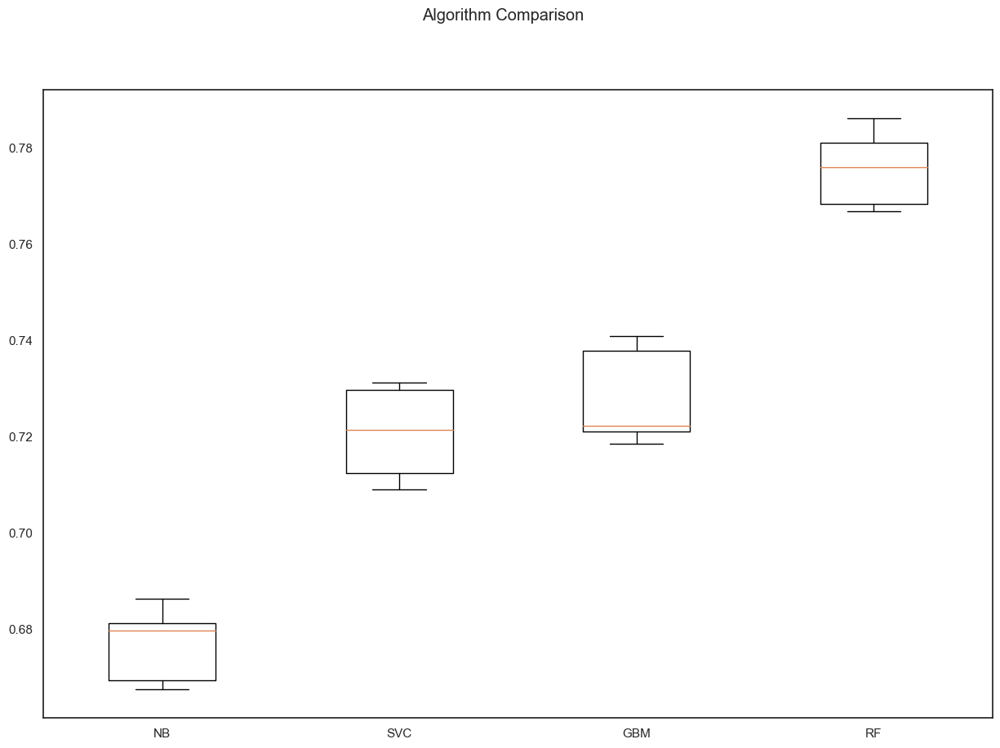

In [47]:
# Compare Algorithms' Performance
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()


In [49]:
#Model Evaluation by testing with independent/external test data set. 
# Make predictions on validation/test dataset

svc = SVC()
gb = GradientBoostingClassifier()
rf = RandomForestClassifier()
nb = GaussianNB()

best_model = rf

best_model.fit(x_train, y_train)
y_pred = best_model.predict(x_test)
print("Best Model Accuracy Score on Test Set:", accuracy_score(y_test, y_pred))


Best Model Accuracy Score on Test Set: 0.7898166023166023


In [50]:
#Model Performance Evaluation Metric 1 - Classification Report
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.78      0.98      0.87      2981
           1       1.00      0.18      0.31       155
           2       0.87      0.31      0.45      1008

    accuracy                           0.79      4144
   macro avg       0.88      0.49      0.54      4144
weighted avg       0.81      0.79      0.75      4144



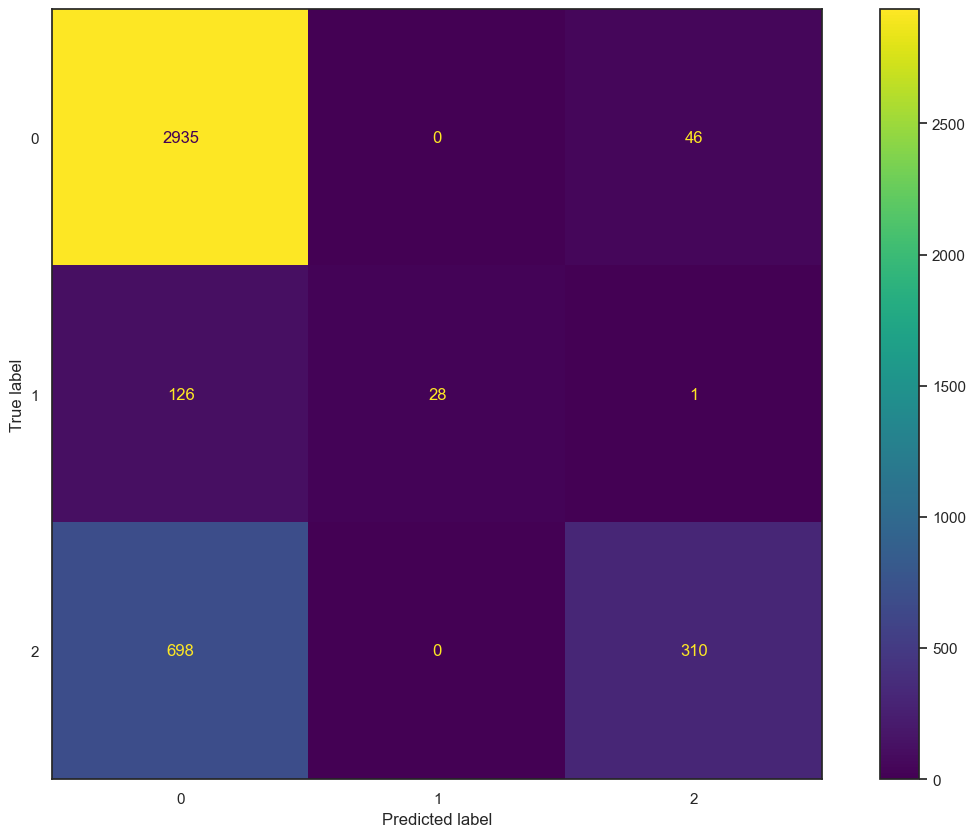

In [51]:
#Model Performance Evaluation Metric 2
#Confusion matrix 
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()


In [59]:
import sys


#Model Evaluation Metric 3-prediction report
for x in range(len(y_pred)):
  print("Predicted: ", y_pred[x], "Actual: ", y_test[x], "Data: ", x_test[x],)

# Define the filename
filename = "prediction_report.txt"

# Open the file in write mode
with open(filename, "w") as file_object:
  # Redirect the standard output to the file
  sys.stdout = file_object

  # Print the prediction report
  for x in range(len(y_pred)):
    print("Predicted: ", y_pred[x], "Actual: ", y_test[x], "Data: ", x_test[x])

  # Reset the standard output
  sys.stdout = sys.__stdout__




Predicted:  0 Actual:  0 Data:  (492, 1095, 8, 7515, 162, 2776, 0, 368, 972, 12193)
Predicted:  0 Actual:  1 Data:  (492, 1015, 8, 5705, 79, 1897, 392, 643, 917, 3781)
Predicted:  0 Actual:  0 Data:  (339, 992, 3, 6429, 102, 2510, 862, 623, 743, 8400)
Predicted:  0 Actual:  2 Data:  (523, 1107, 7, 5322, 155, 172, 3859, 1164, 504, 5789)
Predicted:  0 Actual:  2 Data:  (447, 1100, 8, 5297, 91, 2150, 211, 365, 884, 11196)
Predicted:  0 Actual:  0 Data:  (422, 626, 10, 3746, 134, 2590, 1229, 767, 433, 8587)
Predicted:  0 Actual:  2 Data:  (529, 958, 5, 6411, 150, 1505, 0, 1196, 880, 11903)
Predicted:  0 Actual:  0 Data:  (224, 594, 6, 814, 88, 1236, 3888, 442, 757, 14201)
Predicted:  0 Actual:  0 Data:  (218, 1090, 7, 5503, 185, 1374, 1329, 773, 547, 2379)
Predicted:  0 Actual:  0 Data:  (715, 808, 2, 5802, 511, 2175, 2925, 755, 1035, 12106)
Predicted:  0 Actual:  0 Data:  (289, 869, 0, 3628, 71, 2512, 0, 723, 1113, 14649)
Predicted:  0 Actual:  0 Data:  (305, 875, 0, 5279, 812, 821, 1924,